# **Project: Anomaly Detection for AITEX Dataset**
#### Track: DRÆM
## `Notebook 3.1`: Synthetic Anomaly Generation for AITEX (DRAEM Training)
**Author**: Oliver Grau 

**Date**: 27.03.2025  
**Version**: 1.0

## 📚 Table of Contents

- [1. Motivation](#1-motivation)
- [2. Core Concepts](#2-core-concepts)
- [3. Tasks in this notebook](#3-tasks-in-this-notebook)
- [4. Why These Synthetic Anomalies for AITEX](#4-why-these-synthetic-anomalies-for-aitex)
- [5. Overall Strategy](#5-overall-strategy)
- [6. Basic synthetic anomalies](#6-basic-synthetic-anomalies)
- [7. Summary and Outlook](#7-summary-and-outlook)

---

## 1. Motivation

Since the DRAEM approach is *semi-unsupervised*, it learns from **normal (non-defective) samples only**.  
To enable the model to learn *how anomalies may look like*, we simulate them during training.

This notebook focuses on designing **synthetic pixel-level corruptions** that are:
- **diverse** enough to cover various anomaly patterns
- yet **realistic** enough to mimic real-world fabric defects

## 2. Core Concepts

### 🔧 1. Why synthetic anomalies?

- In AITEX, the number of *real defective patches is limited*.
- We aim to *learn normality*, not anomalies directly.
- We simulate anomalies using noise/textures/shapes during training and let the model learn to spot them as "unexpected".

### 🎨 2. Types of Synthetic Anomalies

Here are common strategies that are effective for fabric datasets:

| Type | Description | Tools |
|------|-------------|-------|
| **Blob-based corruptions** | Irregular regions of noise | Random brush masks, noise overlays |
| **Texture overlays** | Foreign pattern mixed with image | CutPaste, random texture blends |
| **Color shifts** | Local brightness or contrast spikes | Per-region jitter |
| **Geometric masks** | Synthetic shapes or distortions | Ellipses, rectangles, sine waves |

### 📏 3. Binary Anomaly Masks

Each synthetic corruption should come with a **binary mask** (same resolution as the image):
- `0`: Unmodified (normal) region
- `1`: Modified (anomalous) region

This will be used as the *ground truth* for pixel-level supervision during training.

## 3. Tasks in This Notebook

1. **Design & implement** anomaly generation functions:
    - `apply_blob_noise()`
    - `apply_texture_patch()`
    - `apply_cutpaste()`
    - `generate_random_mask()` (for brushing/drawing)

2. **Visualize** examples of `(original, corrupted, mask)` triplets.

3. **Test integration** with `DRAEMDataset`.

### 📦 Output

At the end of this notebook, you will have:
- A flexible corruption pipeline ready for `DRAEMDataset`
- Visual verification that our synthetic anomalies resemble AITEX-like defects
- A foundation for training the DRAEM reconstruction + segmentation network

## 4. Why These Synthetic Anomalies for AITEX?

The **AITEX fabric dataset** contains a variety of **defect types**, such as:
- missing yarns
- stains or blobs
- irregular weaves
- local disruptions in regular texture

To **simulate these effectively**, we use synthetic anomalies that mimic visual patterns of real fabric faults:


### 1. 🫧 `apply_blob_noise()` – *Irregular noise blobs*
- **What it does:** Applies random patches of Gaussian or Perlin noise to local areas.
- **Why it's good for AITEX:** Mimics *dirt, stains, or dye issues* common in industrial fabrics.
- **Visual style:** Irregular, soft-edged anomalies that differ in texture.


### 2. 🧵 `apply_texture_patch()` – *Insert foreign pattern*
- **What it does:** Inserts a small patch from a different image region or from a texture bank.
- **Why it's good for AITEX:** Simulates *foreign material*, *weaving errors*, or *abnormal thread overlaps*.
- **Visual style:** Local texture mismatch, which is very typical in real defects.


### 3. ✂️ `apply_cutpaste()` – *Cut-paste transformations*
- **What it does:** Cuts a patch and pastes it in another position, optionally blending it or distorting it.
- **Why it's good for AITEX:** Resembles *production line misalignments*, *thread misplacement*, or *cutting errors*.
- **Visual style:** Sharp-edged artifacts with local misalignment.


### 4. 🌀 `generate_random_mask()` – *Irregular anomaly shapes*
- **What it does:** Creates brush-style masks with blob-like or brushstroke shapes.
- **Why it's good for AITEX:** Produces *irregular defect regions* similar to how real anomalies don’t follow geometric rules.
- **Visual style:** Non-rectangular masks that align with real-world fabric disturbances.


## 5. Overall Strategy

The goal isn’t to perfectly recreate real defects. Instead it does:
- Teach the network **what is "normal"** (by contrast)
- Encourage **robustness to diverse corruptions**
- Ensure the **anomaly region is spatially localized** and visually distinct

These functions offer a **good balance between simplicity and realism**, and they:
- Are **fast** to compute on-the-fly
- Are **diverse** in type and region
- Result in **pixel-level ground truth** masks
- Make no assumptions about the type of anomaly — generalizable

## 6. Basic synthetic Anomalies
Let's start with the `apply_blob_noise_with_texture_distortion` function. Code can be found in ``dataset_utils/draem/anomaly_creation.py``.

### Blob Noise with Texture Distortion

In [2]:
import torchvision.transforms as T
from codebase.data.draem.dataset import DRAEMDataset
from codebase.data.draem.anomaly_creation import apply_blob_noise_with_texture_distortion
import torch

# basic transforms (many transforms are already applied by the FabricPatchDataset
base_transform = T.Compose([
    T.Grayscale(num_output_channels=1),
    T.ToTensor(),
])

dataset = DRAEMDataset(
    normal_folder="./artifacts/preprocessed_patches/draem_normal_data",
    base_transform=base_transform,
    corruption_transform=lambda x: tuple(
        torch.tensor(arr, dtype=torch.float32).unsqueeze(0)
        for arr in apply_blob_noise_with_texture_distortion(
            x,
            num_blobs=2,
            radius_range=(6, 20),
            noise_strength=0.25,
            warp_strength=13.5,
            blur_prob=0.6
        )
    )
)

#### ✅ Recommended Parameters for `apply_blob_noise_with_texture_distortion` (AITEX)

Based on:
- grayscale textile patches (256×256)
- the fact that real defects are often *small*, *localized*, and *texture-altering*

Here’s a **balanced setup**:

| Parameter         | Recommended Value | Reason                                                                 |
|------------------|-------------------|------------------------------------------------------------------------|
| `num_blobs`      | `2–4`             | 1 blob may be too sparse; 2–4 gives good diversity                     |
| `radius_range`   | `(6, 20)`         | Defects in AITEX often range from ~5%–15% patch size                   |
| `noise_strength` | `0.15`            | Subtle but visible – higher may destroy structure                     |
| `warp_strength`  | `3.5`             | Strong enough to bend texture without looking artificial               |
| `blur_prob`      | `0.6`             | Blurring some defects mimics out-of-focus or textile soft edges       |

---

#### 🧪 We can experiment with:

- `num_blobs=5–6` for very hard cases (but risk overfitting)
- `warp_strength=2.0` for gentler distortions
- `blur_prob=0.0` to enforce only texture-based anomalies

---

Let's test our noise function. For that we use a visualization helper function `show_draem_batch`:

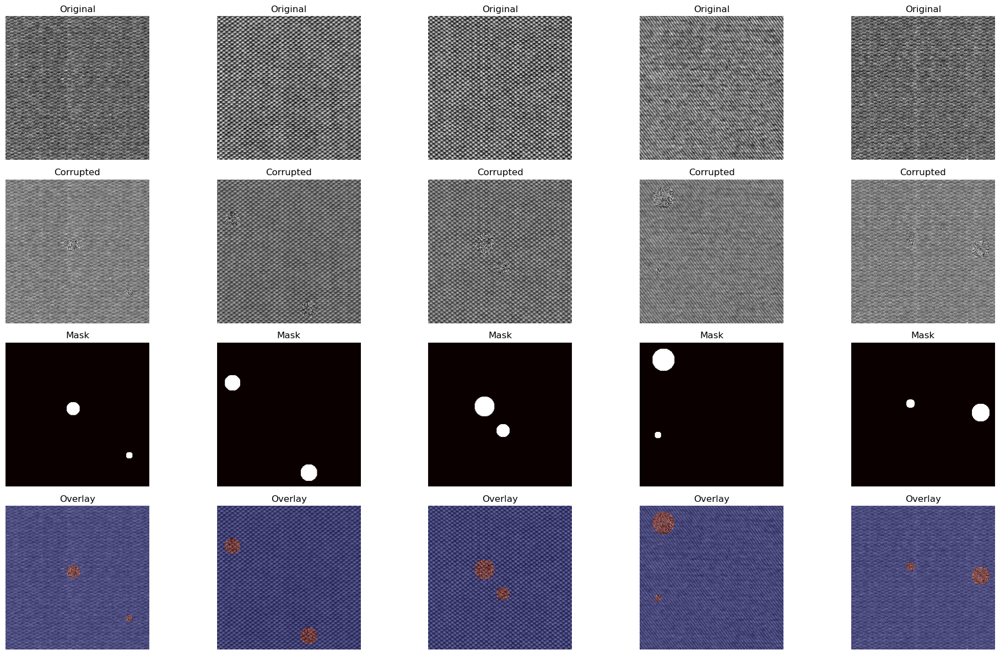

In [3]:
from codebase.data.draem.visualization import show_draem_batch

show_draem_batch(dataset, n=5)

---

### Texture Patch
Next anomaly we create is `apply_texture_patch` function.

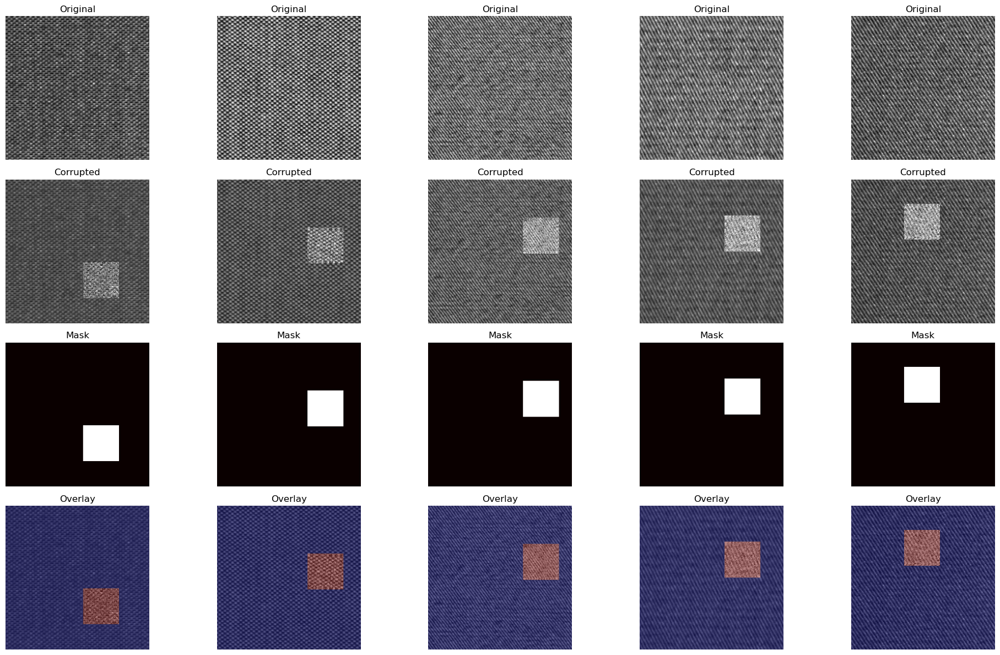

In [4]:
from torchvision import transforms
from codebase.data.draem.anomaly_creation import apply_texture_patch
from codebase.data.draem.visualization import show_draem_batch
from codebase.data.draem.dataset import DRAEMDataset
import torch
import torchvision.transforms as T

base_transform = transforms.Compose([
    T.Grayscale(num_output_channels=1),
    transforms.ToTensor()
])

dataset = DRAEMDataset(
    normal_folder="./artifacts/preprocessed_patches/draem_normal_data",
    base_transform=base_transform,
    corruption_transform=lambda x: tuple(
        torch.tensor(arr, dtype=torch.float32).unsqueeze(0)
        for arr in apply_texture_patch(
            x,
            patch_size=(64, 64),
            noise_strength=0.15,
            contrast_factor=1.5,
            num_patches=1,
            blend=True
        )
    )
)

show_draem_batch(dataset, n=5)

---

### CutPaste Anomaly

**Goal:** Simulate realistic anomalies by copying a region of the image and pasting it elsewhere — disrupting the texture continuity without introducing foreign patterns.

#### Why it works
- Textures like fabric rely on consistent global structure.
- When a region is moved (even if visually similar), the **context is broken**.
- It creates **plausible but noticeable structural anomalies** (like misaligned threads or shifted weave).

#### CutPaste Variants
Common options:
1. **Cut-and-Paste:** Cut a patch, paste it elsewhere
2. **Cut-and-Shift:** Cut and move slightly (local)
3. **Cut-and-Rotate:** Cut and rotate before pasting
4. **Cut-and-Warp:** Cut and distort before pasting

We'll start with the **basic version** and can add variants later.

#### Visual Expectations
- Without blending: sharp "cut-in" anomalies (harsh edges)
- With blending: more subtle, like stitched patches or material inconsistency
- With rotation: geometric inconsistencies (good for generalization)

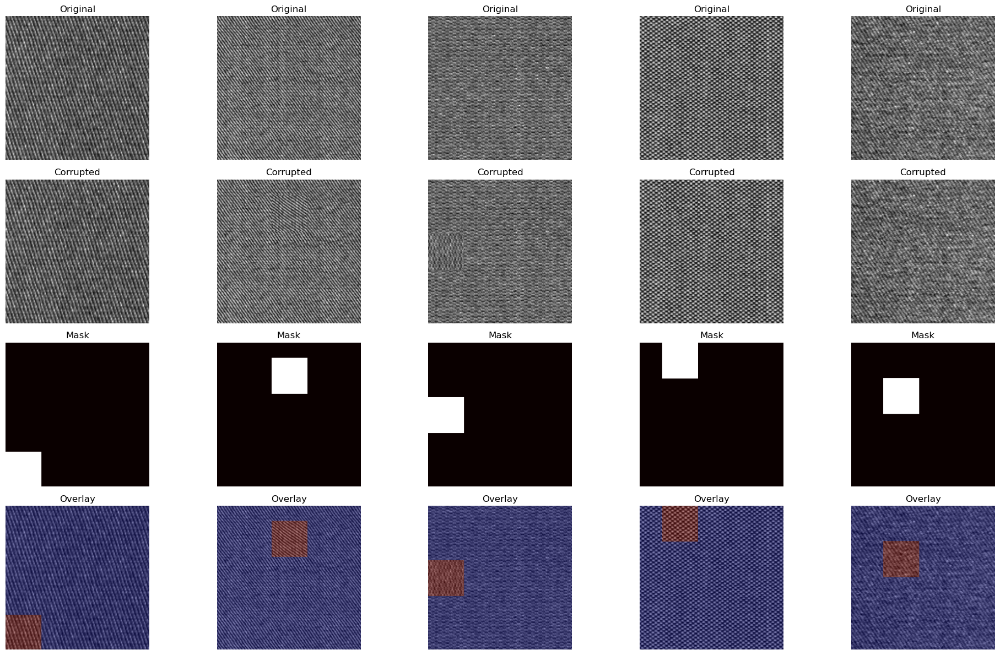

In [6]:
from torchvision import transforms
from codebase.data.draem.anomaly_creation import apply_cutpaste
from codebase.data.draem.visualization import show_draem_batch
from codebase.data.draem.dataset import DRAEMDataset
import torch
import torchvision.transforms as T

base_transform = transforms.Compose([
    T.Grayscale(num_output_channels=1),
    transforms.ToTensor()
])

dataset = DRAEMDataset(
    normal_folder="./artifacts/preprocessed_patches/draem_normal_data",
    base_transform=base_transform,
    corruption_transform=lambda x: tuple(
        torch.tensor(arr, dtype=torch.float32).unsqueeze(0)
        for arr in apply_cutpaste(
            x,
            patch_size=(64, 64),
            max_translation=48,
            blend=False, # difficult to detect the distortion
            rotate=True
        )
    )
)

show_draem_batch(dataset, n=5)

---

### Generate random Mask

**Goal:** Generate a random binary mask that defines where to apply a synthetic anomaly — often used to:
- Define the shape of the anomaly region.
- Control where noise, texture, or transformations are applied.

The mask can be:
- **Blobby**, using e.g. Gaussian blobs or perlin noise.
- **Sparse**, using random strokes or splats.
- **Patchy**, based on cut-paste patterns.

Once the mask is created, you apply a transformation (e.g. noise, blur, texture) **only inside the masked area**, keeping the rest of the image clean.


#### Typical Use Case

You don’t just call `generate_random_mask()` alone — it’s usually combined with a corruption function:

```python
mask = generate_random_mask()
corrupted = image.copy()
corrupted[mask == 1] = noise_or_texture_or_blur(...)
```

This gives **control** over what gets corrupted **and where**.


#### 🌈 Visual Look
This will create **smooth blob-like regions** with added noise. It simulates:
- Burnout spots
- Dirty regions
- Stains or chemical exposure


#### ✅ Summary

| Component             | Purpose                            |
|----------------------|-------------------------------------|
| `generate_random_mask()` | Defines irregular regions to corrupt |
| `apply_masked_noise()`   | Applies noise only in masked areas   |
| `corruption_transform=`  | Makes it plug-and-play in your dataset |

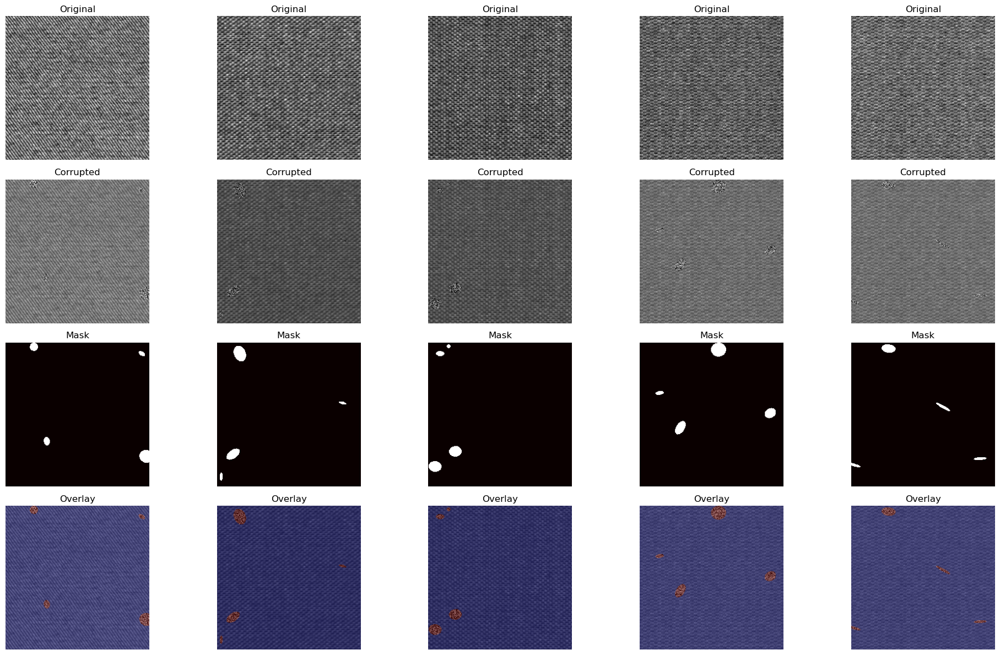

In [7]:
from torchvision import transforms
from codebase.data.draem.anomaly_creation import apply_masked_noise
from codebase.data.draem.visualization import show_draem_batch
from codebase.data.draem.dataset import DRAEMDataset
import torch
import torchvision.transforms as T
from codebase.data.draem.visualization import show_draem_batch

base_transform = transforms.Compose([
    T.Grayscale(num_output_channels=1),
    transforms.ToTensor()
])

dataset = DRAEMDataset(
    normal_folder="./artifacts/preprocessed_patches/draem_normal_data",
    base_transform=base_transform,
    corruption_transform=lambda x: tuple(
        torch.tensor(arr, dtype=torch.float32).unsqueeze(0)
        for arr in apply_masked_noise(
            x,
            noise_strength=0.25,
            num_blobs=4
        )
    )
)

show_draem_batch(dataset, n=5)

---

### Texture line:

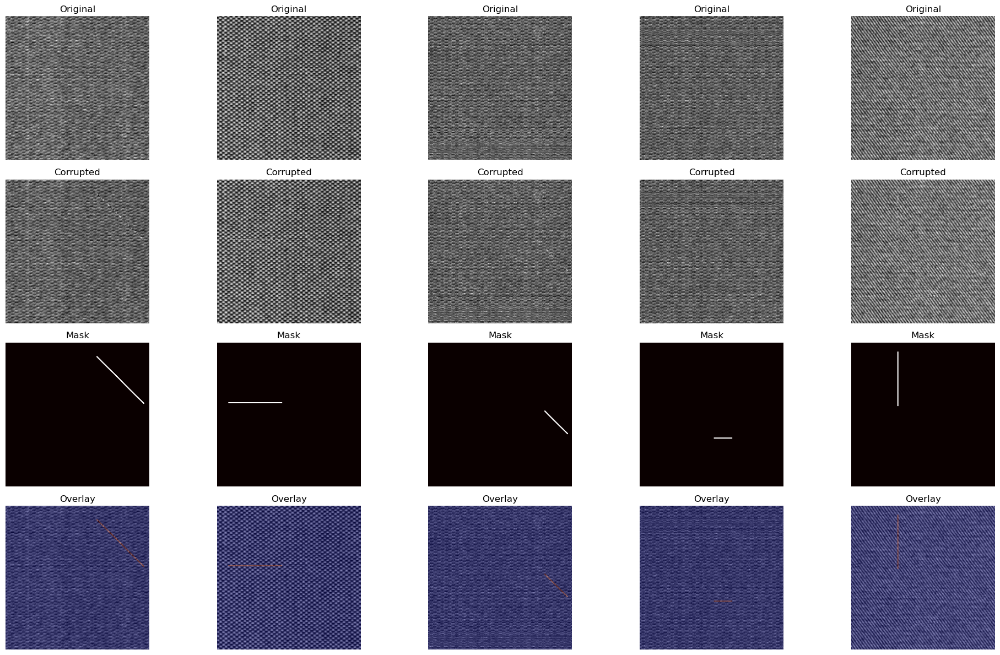

In [9]:
from torchvision import transforms
from codebase.data.draem.anomaly_creation import apply_texture_line
from codebase.data.draem.visualization import show_draem_batch
from codebase.data.draem.dataset import DRAEMDataset
import torch
import torchvision.transforms as T

base_transform = transforms.Compose([
    T.Grayscale(num_output_channels=1),
    #transforms.Resize((224, 224)),
    transforms.ToTensor()
])

dataset = DRAEMDataset(
    normal_folder="./artifacts/preprocessed_patches/draem_normal_data",
    base_transform=base_transform,
    corruption_transform=lambda x: tuple(
        torch.tensor(arr, dtype=torch.float32).unsqueeze(0)
        for arr in apply_texture_line(
            x,            
            line_thickness=2,
            blend_alpha=0.5,
            jitter=3
        )
    )
)

show_draem_batch(dataset, n=5)

---

### ❓ Real-World Consideration: How Are Anomalies Created in Practice?

In the context of real-world DRÆM applications, one critical challenge arises:  
Creating realistic, high-quality synthetic anomalies typically requires **complex image manipulation techniques** — such as FFT filtering, edge perturbations, texture blending, or even domain-specific visual artifacts.

> This level of manipulation goes beyond standard data augmentation and often demands expertise in **image processing**, **signal transformation**, or even **visual design**.  
> However, not every ML or AI developer has this skill set.

💬 **This raises a key practical question:**

> 🧠 *In real DRÆM-based projects, how is the creation of fitting anomalies typically handled? Do teams rely on domain experts, reusable libraries, visual designers, or even simulation engines?*

Understanding this aspect is crucial when deciding whether DRÆM is a practical fit for a given industrial or research application.



In practice, **anomaly generation** (especially synthetic ones for training models like DRÆM) is **non-trivial** and often one of the most **creative and domain-specific** parts of the pipeline. Here's how it's typically handled in real-life projects:



#### 🧩 1. **Leverage Domain Experts or Visual Designers (Human-in-the-Loop)**
- In industrial applications (e.g., manufacturing, medical imaging), anomaly simulation is often done **in collaboration with domain experts**.
- These experts guide **what "real" defects look like**, e.g., scratches, dents, tumors, misprints, or contamination.
- Sometimes **graphic designers or data engineers** with image processing experience are pulled in to help simulate those anomalies.

➡️ *Think of it like designing test cases that "look real enough" — not just random distortions.*



#### 🧪 2. **Use Physics-based or CAD Simulations (if available)**
- In manufacturing or engineering, **physics engines, CAD tools, or simulators** are used to generate both normal and defected samples.
- This avoids manual manipulation and makes the data more realistic and scalable.

➡️ *Example:* In automotive, scratches or deformities are simulated via material deformation in CAD.



#### 🧠 3. **Dedicated Image Processing Engineers or Tooling**
- Large companies or AI teams often have **dedicated roles** or **shared libraries** for synthetic anomaly creation.
- These libraries include modular image transformations like blobs, cracks, texture overlays, occlusions, noise fields, etc.
- Over time, these evolve into **internal anomaly toolkits** that are reused across projects.

➡️ *This is similar to what we’re building right now with our `AnomalyPipeline` – a modular, flexible framework.*



#### 🧰 4. **Use Prebuilt Anomaly Libraries or Generative Models**
- Some teams rely on **open-source libraries** or **pretrained models** to generate texture-based or noise-based defects.
  - E.g., `anomalib` (by Intel), `Albumentations`, or domain-specific libraries.
- Some use **StyleGANs** or **Diffusion Models** trained to generate "normal" samples, and then generate outliers by inverting the generator.

➡️ *In these cases, the anomaly creation is abstracted away, but control is limited.*



#### ⚠️ 5. **When All Else Fails: Use Only Real Defects (Unsupervised)**
- If creating realistic synthetic anomalies is too hard or risky, some teams avoid it altogether.
- Instead, they use only **normal images for training**, and rely on models like PatchCore, SPADE, FastFlow, or Vanilla Autoencoders to detect anything that doesn't fit the learned "normal."

➡️ *This avoids synthesis entirely, but requires sufficient variation in real normal data.*



#### 🚧 Challenges & Reality Check
- **Not every ML engineer is skilled in image-level manipulation** — and that creates a bottleneck in DRÆM-style projects.
- This is **why DRÆM is powerful but less commonly used out-of-the-box in industry** compared to purely unsupervised methods like PatchCore or FastFlow.
- Teams that **invest in anomaly simulation capabilities** (tooling + human know-how) are more likely to succeed with DRÆM or similar strategies.

---

## 7. Summary and Outlook

In this notebook, we've laid the groundwork for generating synthetic anomalies on textile-like datasets such as AITEX. By applying targeted modifications to normal fabric patches, we've observed how basic defect types (e.g., blobs, lines, distortions) can be inserted into images to simulate real-world anomalies.

While this static or batch-based approach is helpful for initial experimentation, it comes with some limitations:

- Anomaly types and locations are predefined or randomly sampled in bulk
- There's limited variation in anomaly **shape, coverage, and style**
- Generation is not integrated into the training loop (i.e., not *on the fly*)

To overcome these limitations, we now move toward designing a **fully modular, dynamic anomaly pipeline** that supports:

- 💡 On-the-fly anomaly generation (during training or evaluation)
- 🎛 Configurable parameters for each anomaly type (e.g., severity, position, color, frequency)
- 🧪 Controlled sampling of anomalies to mimic real-world imbalance and uncertainty
- 🧱 A clean class-based structure allowing new anomaly functions to be easily added

This will give us the flexibility to:

- Simulate a broad spectrum of defect types
- Apply curriculum-based or probabilistic sampling strategies
- Control anomaly difficulty for training vs. testing

➡️ In the next notebook (**`03.2 Synthetic Anomaly Generation.ipynb`**) , we will build this **anomaly pipeline system** as a configurable, callable component. Designed to seamlessly plug into training and evaluation workflows for models like DRÆM, VAE, or even CNN-based baselines.

Let’s create a foundation that brings **realism, control, and variation** to our synthetic anomaly generation strategy.

<p style="font-size: 0.8em; text-align: center;">© 2025 Oliver Grau. Educational content for personal use only. See LICENSE.txt for full terms and conditions.</p>